**Week1: Project Initialization and Dataset Acquisition**

In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
import os

# Path to your Drive (My Drive is the root folder)
folder_path = "/content/drive/MyDrive/VisionExtract"

# Create folder if it doesn't exist
if not os.path.exists(folder_path):
    os.makedirs(folder_path)
    print("✅ Folder created:", folder_path)
else:
    print("⚡ Folder already exists:", folder_path)


✅ Folder created: /content/drive/MyDrive/VisionExtract


In [17]:
import os

train_folder = "/content/drive/MyDrive/VisionExtract/train2017_subset"
val_folder = "/content/drive/MyDrive/VisionExtract/val2017"

train_images = [f for f in os.listdir(train_folder) if f.endswith(('.jpg', '.jpeg', '.png'))]
val_images = [f for f in os.listdir(val_folder) if f.endswith(('.jpg', '.jpeg', '.png'))]

print("Training images:", len(train_images))
print("Validation images:", len(val_images))


Training images: 1759
Validation images: 5000


In [20]:
import json

annotation_file = "/content/drive/MyDrive/VisionExtract/annotations/instances_val2017.json"  # example path

with open(annotation_file) as f:
    data = json.load(f)

# List all categories
categories = data['categories']
for cat in categories:
    print(f"ID: {cat['id']}, Name: {cat['name']}")


ID: 1, Name: person
ID: 2, Name: bicycle
ID: 3, Name: car
ID: 4, Name: motorcycle
ID: 5, Name: airplane
ID: 6, Name: bus
ID: 7, Name: train
ID: 8, Name: truck
ID: 9, Name: boat
ID: 10, Name: traffic light
ID: 11, Name: fire hydrant
ID: 13, Name: stop sign
ID: 14, Name: parking meter
ID: 15, Name: bench
ID: 16, Name: bird
ID: 17, Name: cat
ID: 18, Name: dog
ID: 19, Name: horse
ID: 20, Name: sheep
ID: 21, Name: cow
ID: 22, Name: elephant
ID: 23, Name: bear
ID: 24, Name: zebra
ID: 25, Name: giraffe
ID: 27, Name: backpack
ID: 28, Name: umbrella
ID: 31, Name: handbag
ID: 32, Name: tie
ID: 33, Name: suitcase
ID: 34, Name: frisbee
ID: 35, Name: skis
ID: 36, Name: snowboard
ID: 37, Name: sports ball
ID: 38, Name: kite
ID: 39, Name: baseball bat
ID: 40, Name: baseball glove
ID: 41, Name: skateboard
ID: 42, Name: surfboard
ID: 43, Name: tennis racket
ID: 44, Name: bottle
ID: 46, Name: wine glass
ID: 47, Name: cup
ID: 48, Name: fork
ID: 49, Name: knife
ID: 50, Name: spoon
ID: 51, Name: bowl
ID: 5

**Segmented image**
**:**

Found existing installation: pycocotools 2.0.10
Uninstalling pycocotools-2.0.10:
  Successfully uninstalled pycocotools-2.0.10
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pycocotools: filename=pycocotools-2.0.10-cp312-abi3-linux_x86_64.whl size=322401 sha256=54932850096bddcd951ab286ce4375d3efb3648bdd9cf7d9c5e0693318c54250
  Stored in directory: /root/.cache/pip/wheels/21/45/b6/f489741f07985a1b09fd4c8339cf7e20f6a052e7290c690b4b
Successfully built pycocotools
loading annotations into memory...
Done (t=0.37s)
creating index...
index created!


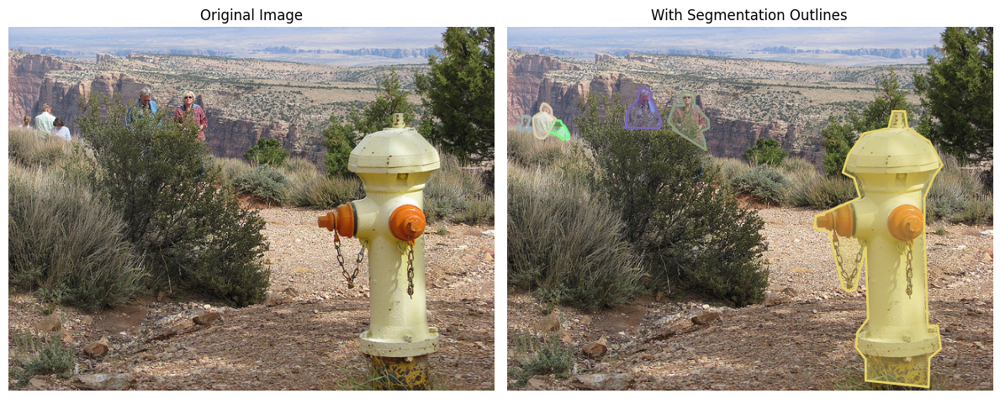

In [21]:
# =========================
# Step 0: Install pycocotools correctly
# =========================
!pip uninstall -y pycocotools
!pip install pycocotools --no-binary pycocotools

# =========================
# Step 1: Imports
# =========================
import os
import random
import matplotlib.pyplot as plt
import cv2
from pycocotools.coco import COCO

# ======================
# Step 2: Paths
# ======================
ANN_FILE = "/content/drive/MyDrive/VisionExtract/annotations/instances_val2017.json"
IMG_DIR = "/content/drive/MyDrive/VisionExtract/val2017"

# Load COCO dataset
coco = COCO(ANN_FILE)

# ======================
# Step 3: Pick a random image
# ======================
img_id = random.choice(coco.getImgIds())
img_info = coco.loadImgs(img_id)[0]

# Load image
img_path = os.path.join(IMG_DIR, img_info['file_name'])
image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

# Load annotations for this image
ann_ids = coco.getAnnIds(imgIds=img_id)
anns = coco.loadAnns(ann_ids)

# ======================
# Step 4: Plot Left (Original) + Right (With Outlines)
# ======================
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Left → Original Image
axes[0].imshow(image)
axes[0].set_title("Original Image")
axes[0].axis("off")

# Right → Image with COCO segmentation outlines
plt.sca(axes[1])
plt.imshow(image)
coco.showAnns(anns)  # overlays segmentation outlines
plt.title("With Segmentation Outlines")
plt.axis("off")

plt.tight_layout()
plt.show()


**Display Random Original Images with segmented Images:**

loading annotations into memory...
Done (t=0.40s)
creating index...
index created!


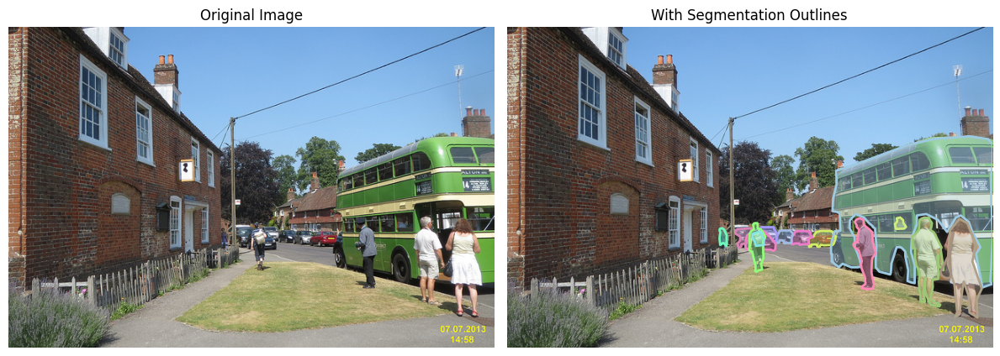

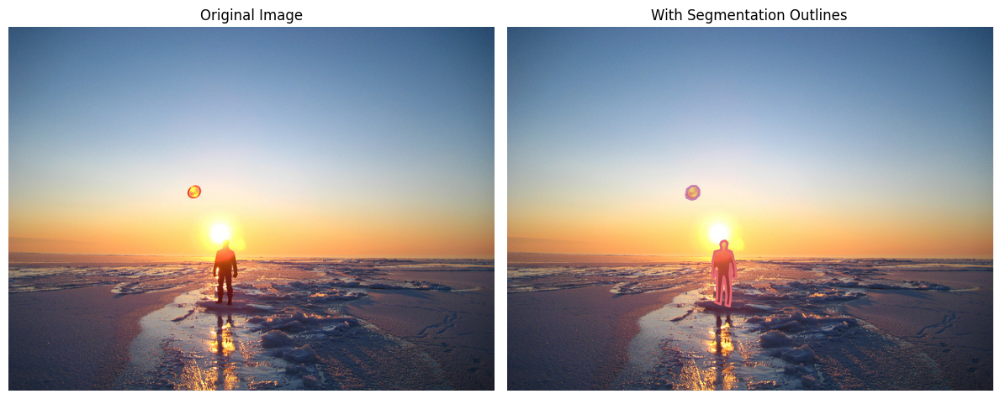

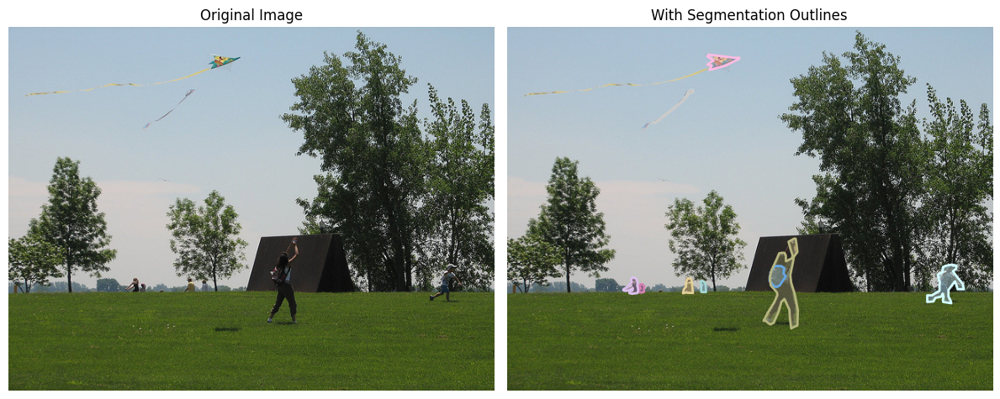

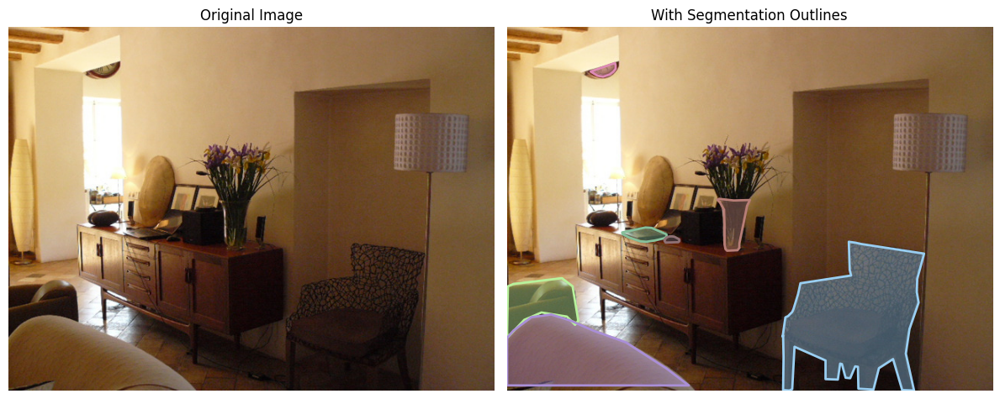

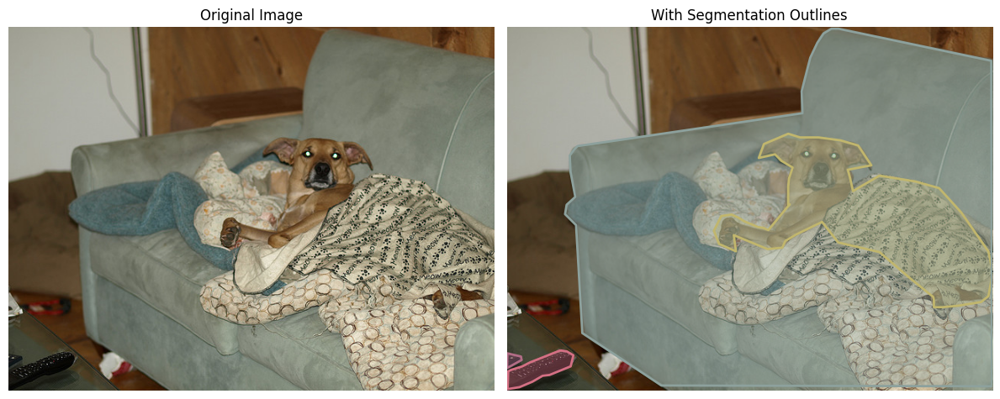

In [24]:
# =========================
# Step 1: Imports
# =========================
import os
import random
import matplotlib.pyplot as plt
import cv2
from pycocotools.coco import COCO

# ======================
# Step 2: Paths
# ======================
ANN_FILE = "/content/drive/MyDrive/VisionExtract/annotations/instances_val2017.json"
IMG_DIR = "/content/drive/MyDrive/VisionExtract/val2017"

# Load COCO dataset
coco = COCO(ANN_FILE)

# ======================
# Step 3: Function to visualize one image with annotations
# ======================
def visualize_image_with_annotations(img_id):
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(IMG_DIR, img_info['file_name'])
    image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Left → Original Image
    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    # Right → Image with COCO segmentation outlines
    plt.sca(axes[1])
    plt.imshow(image)
    coco.showAnns(anns)
    plt.title("With Segmentation Outlines")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

# ======================
# Step 4: Pick 5 random images and visualize
# ======================
random_img_ids = random.sample(coco.getImgIds(), 5)

for img_id in random_img_ids:
    visualize_image_with_annotations(img_id)


**Display Random Original Images with masked Images:**

loading annotations into memory...
Done (t=0.56s)
creating index...
index created!


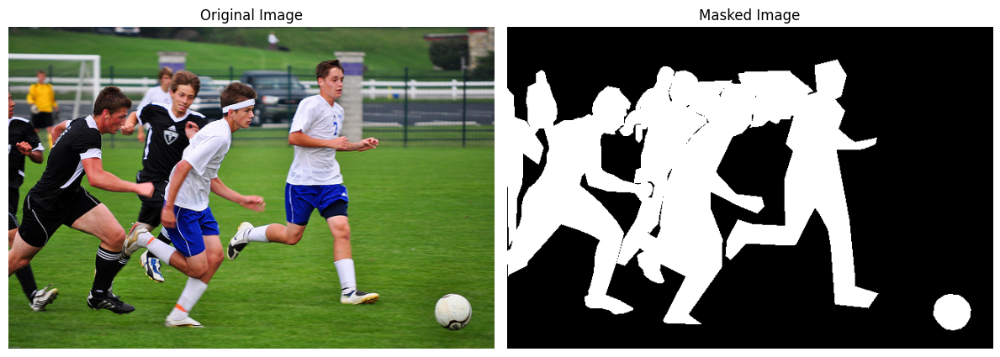

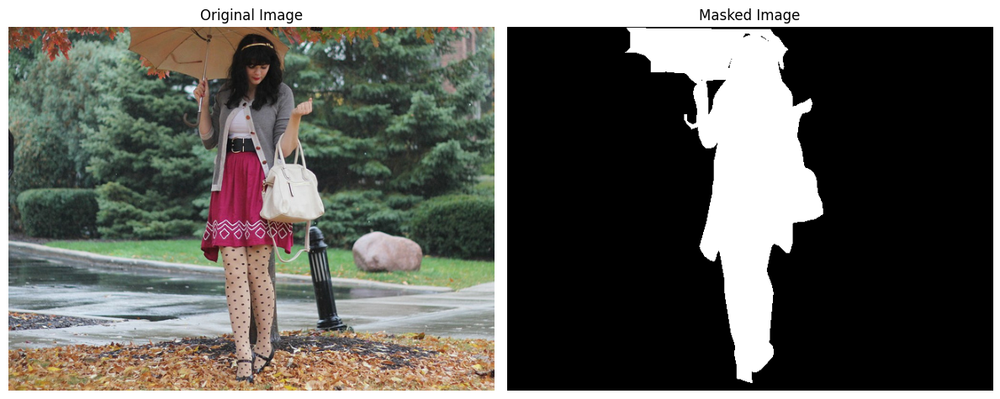

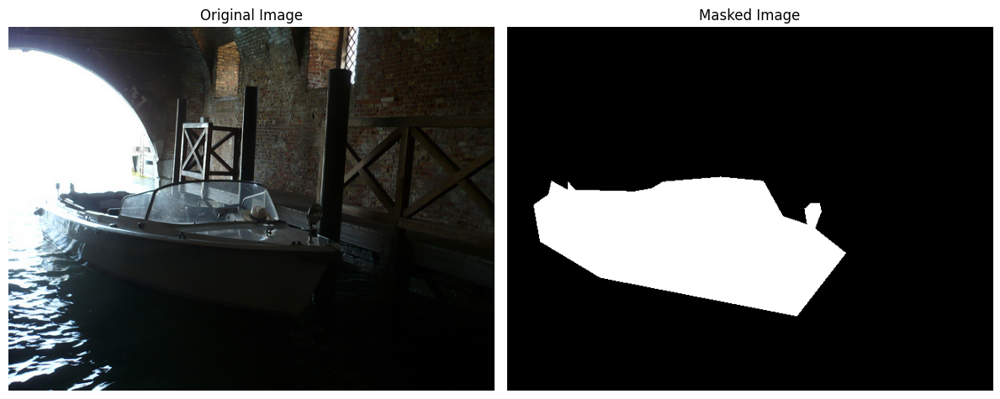

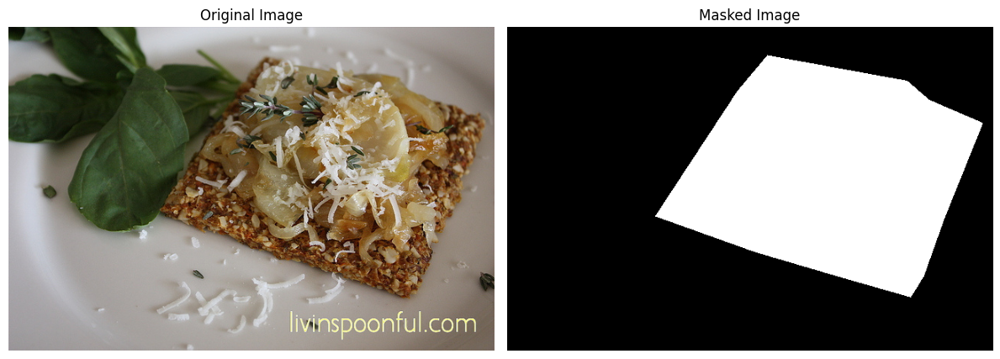

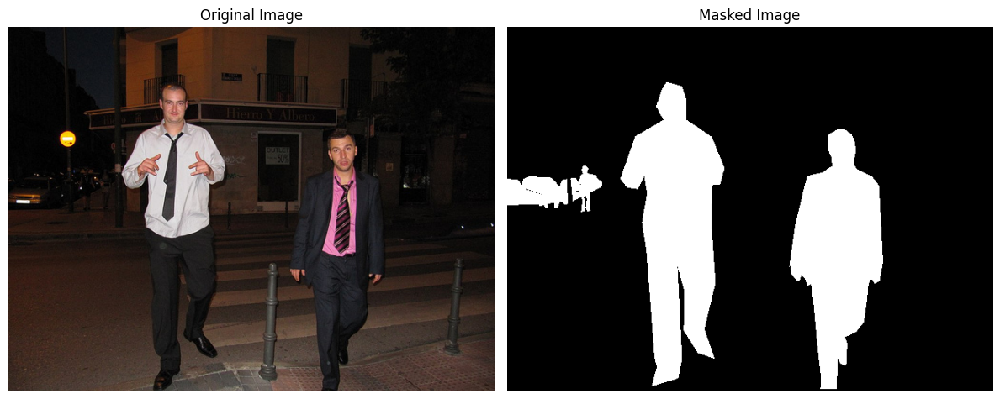

In [26]:
# =========================
# Step 1: Imports
# =========================
import os
import random
import matplotlib.pyplot as plt
import cv2
import numpy as np
from pycocotools.coco import COCO
from pycocotools import mask as mask_utils  # for decoding COCO RLE masks

# ======================
# Step 2: Paths
# ======================
ANN_FILE = "/content/drive/MyDrive/VisionExtract/annotations/instances_val2017.json"
IMG_DIR = "/content/drive/MyDrive/VisionExtract/val2017"

# Load COCO dataset
coco = COCO(ANN_FILE)

# ======================
# Step 3: Function to visualize image with combined mask
# ======================
def visualize_image_and_mask(img_id):
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(IMG_DIR, img_info['file_name'])

    if not os.path.exists(img_path):
        print(f"Image not found: {img_path}")
        return

    image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

    # Create empty mask
    mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)

    # Load annotations for this image
    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)

    for ann in anns:
        if 'segmentation' in ann:
            rle = mask_utils.frPyObjects(ann['segmentation'], img_info['height'], img_info['width'])
            decoded_mask = mask_utils.decode(rle)

            # If decoded_mask is 3D, sum along last dimension
            if decoded_mask.ndim == 3:
                decoded_mask = np.sum(decoded_mask, axis=2)

            mask += decoded_mask

    # Clip mask to 0-1 range
    mask = np.clip(mask, 0, 1)

    # Plot
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    axes[0].imshow(image)
    axes[0].set_title("Original Image")
    axes[0].axis("off")

    axes[1].imshow(mask, cmap='gray')
    axes[1].set_title("Masked Image")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

# ======================
# Step 4: Pick 5 random images and visualize
# ======================
random_img_ids = random.sample(coco.getImgIds(), 5)

for img_id in random_img_ids:
    visualize_image_and_mask(img_id)


**Week2: Data Preprocessing and Validation**

loading annotations into memory...
Done (t=0.63s)
creating index...
index created!


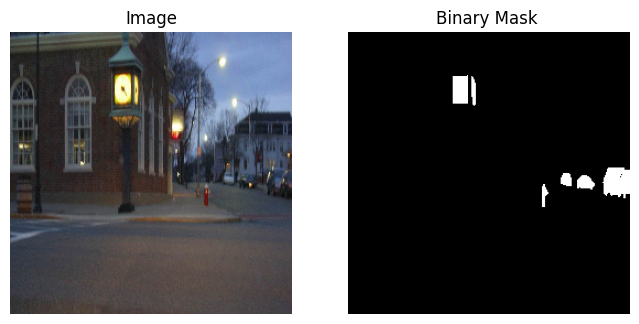

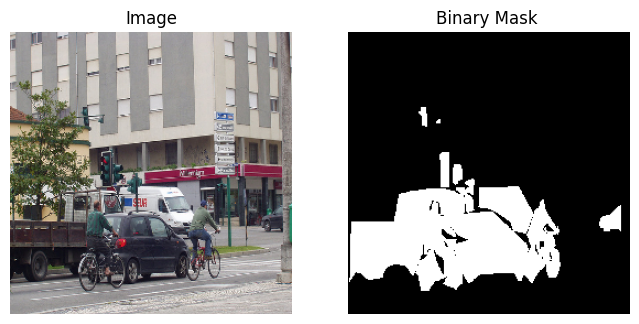

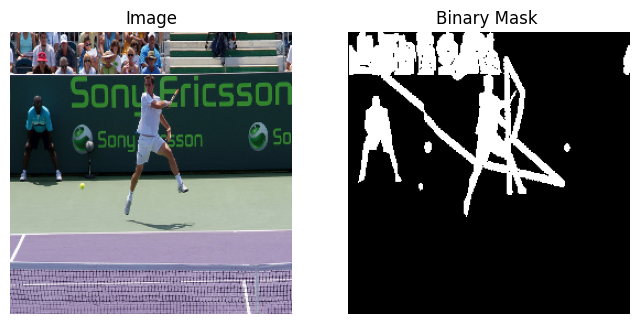

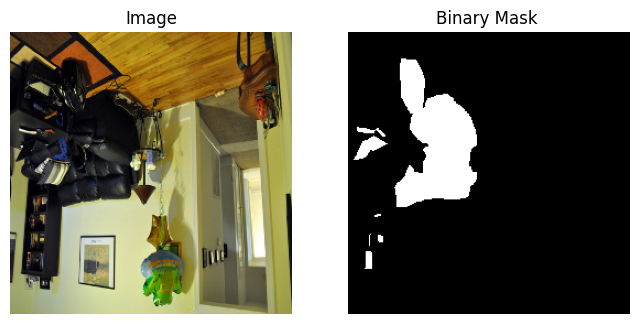

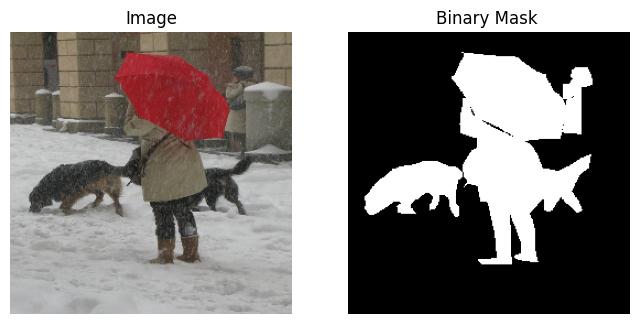

...

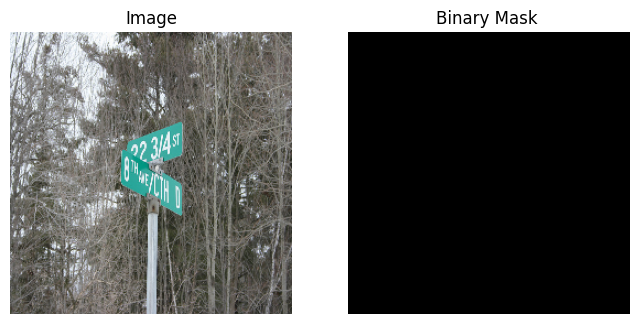

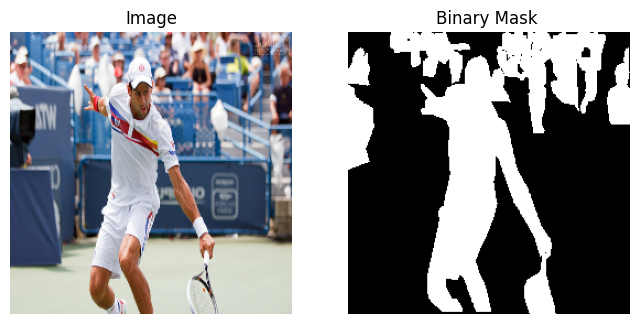

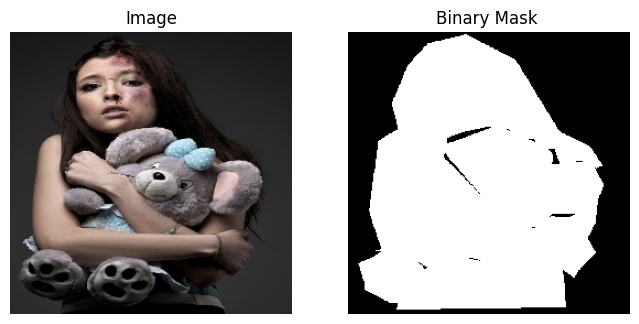

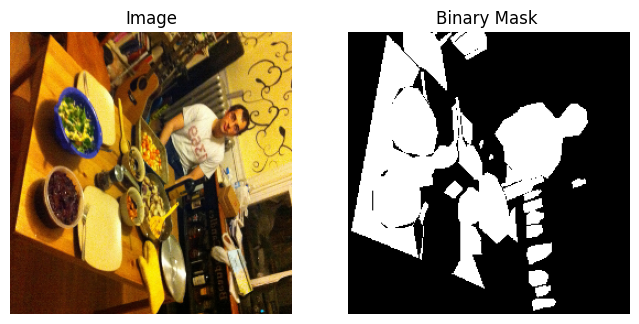

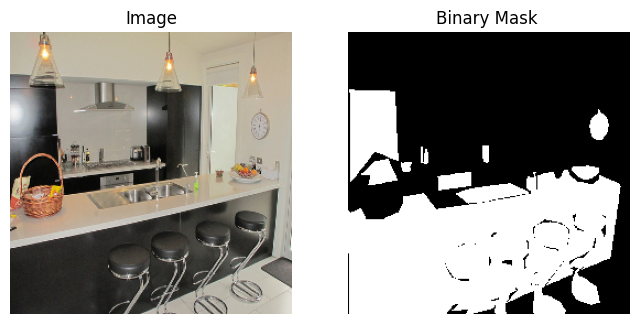

In [36]:
# =========================================
# Week 2: Data Preprocessing Pipeline
# Goal: Preprocess validation images for model input
# =========================================

# =========================
# Step 0: Imports
# =========================
import os
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
from pycocotools import mask as mask_utils
import albumentations as A  # For image augmentations

# =========================
# Step 1: Paths
# =========================
VAL_FOLDER = "/content/drive/MyDrive/VisionExtract/val2017"
ANNOT_FILE = "/content/drive/MyDrive/VisionExtract/annotations/instances_val2017.json"

# Load COCO annotations
coco = COCO(ANNOT_FILE)

# =========================
# Step 2: Preprocessing Parameters
# =========================
IMG_HEIGHT = 256
IMG_WIDTH = 256

# Augmentation pipeline (optional)
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
], additional_targets={'mask': 'mask'})  # Ensures mask transforms same as image

# =========================
# Step 3: Preprocessing Functions
# =========================

def resize_image_and_mask(image, mask):
    """
    Resize image and mask to target size.
    Mask uses INTER_NEAREST to preserve binary values.
    """
    image_resized = cv2.resize(image, (IMG_WIDTH, IMG_HEIGHT))
    mask_resized = cv2.resize(mask, (IMG_WIDTH, IMG_HEIGHT), interpolation=cv2.INTER_NEAREST)
    return image_resized, mask_resized

def normalize_image(image):
    """
    Normalize image pixels to [0,1] range.
    """
    return image / 255.0

def convert_to_binary_mask(mask):
    """
    Convert multi-class mask into binary mask (0 = background, 1 = subject)
    """
    return np.where(mask > 0, 1, 0).astype(np.uint8)

def preprocess_image_and_mask(image, mask):
    """
    Complete preprocessing pipeline:
    1. Resize image & mask
    2. Convert mask to binary
    3. Apply augmentation
    4. Normalize image
    """
    # Resize
    image, mask = resize_image_and_mask(image, mask)

    # Convert to binary mask
    mask = convert_to_binary_mask(mask)

    # Apply optional augmentation
    augmented = transform(image=image, mask=mask)
    image_aug, mask_aug = augmented['image'], augmented['mask']

    # Normalize image
    image_aug = normalize_image(image_aug)

    return image_aug, mask_aug

# =========================
# Step 4: Function to create combined mask
# =========================
def create_combined_mask(img_id):
    """
    Create a single combined mask for all objects in the image.
    """
    img_info = coco.loadImgs(img_id)[0]
    mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)

    ann_ids = coco.getAnnIds(imgIds=img_id)
    anns = coco.loadAnns(ann_ids)

    for ann in anns:
        if 'segmentation' in ann:
            rle = mask_utils.frPyObjects(ann['segmentation'], img_info['height'], img_info['width'])
            decoded_mask = mask_utils.decode(rle)

            # If mask is 3D, sum across channels
            if decoded_mask.ndim == 3:
                decoded_mask = np.sum(decoded_mask, axis=2)

            mask += decoded_mask

    # Clip values to binary 0-1
    mask = np.clip(mask, 0, 1)

    return mask

# =========================
# Step 5: Preprocess & visualize multiple validation images
# =========================
NUM_IMAGES = 15  # Number of random images to visualize
random_val_ids = random.sample(coco.getImgIds(), NUM_IMAGES)

for idx, img_id in enumerate(random_val_ids):
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(VAL_FOLDER, img_info['file_name'])

    if not os.path.exists(img_path):
        continue

    # Load image
    image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

    # Create combined mask
    mask = create_combined_mask(img_id)

    # Preprocess image & mask
    img_processed, mask_processed = preprocess_image_and_mask(image, mask)

    # Visualize
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    plt.imshow(img_processed)
    plt.title(f"Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(mask_processed, cmap='gray')
    plt.title(f"Binary Mask ")
    plt.axis("off")

    plt.show()


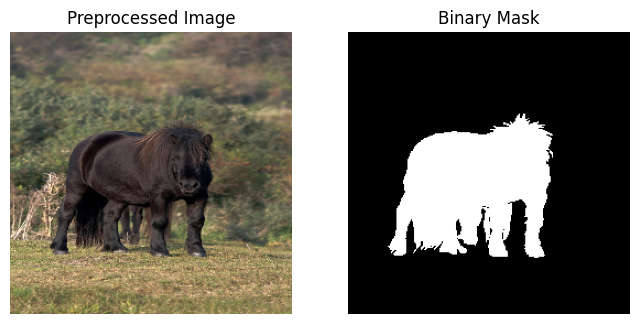

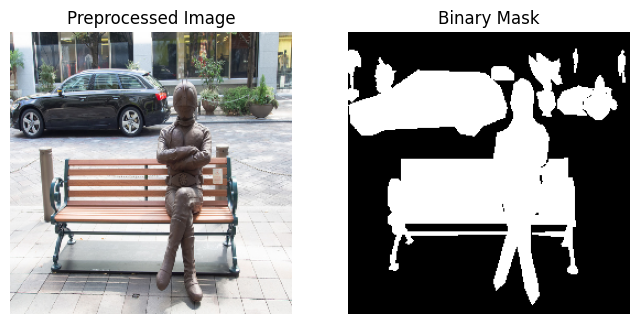

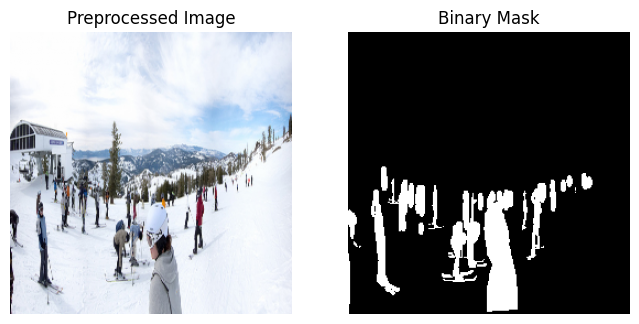

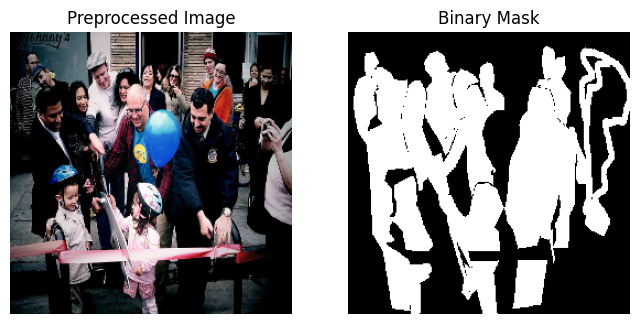

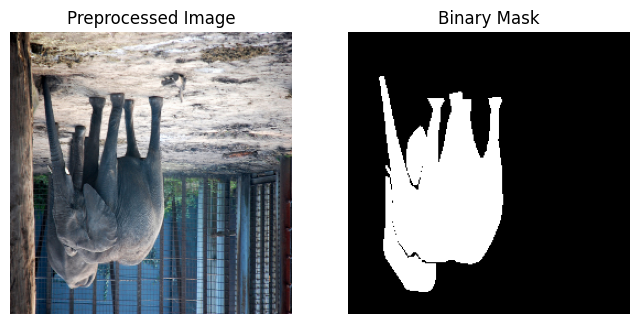

In [37]:
# =========================
# Visualize 5 Random Images with Binary Masks
# =========================
NUM_IMAGES = 5  # visualize only 5
random_val_ids = random.sample(coco.getImgIds(), NUM_IMAGES)

for idx, img_id in enumerate(random_val_ids):
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(VAL_FOLDER, img_info['file_name'])

    if not os.path.exists(img_path):
        continue

    # Load image
    image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

    # Create combined mask
    mask = create_combined_mask(img_id)

    # Preprocess image & mask
    img_processed, mask_processed = preprocess_image_and_mask(image, mask)

    # Visualize
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    plt.imshow(img_processed)
    plt.title("Preprocessed Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(mask_processed, cmap='gray')
    plt.title("Binary Mask")
    plt.axis("off")

    plt.show()


**id:7 train images**

loading annotations into memory...
Done (t=0.44s)
creating index...
index created!
Total images in val2017: 5000
Sample images: ['000000022892.jpg', '000000022705.jpg', '000000018770.jpg', '000000021903.jpg', '000000022396.jpg', '000000021503.jpg', '000000018737.jpg', '000000022371.jpg', '000000017899.jpg', '000000020333.jpg']
Total categories: 80
Categories: ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed'

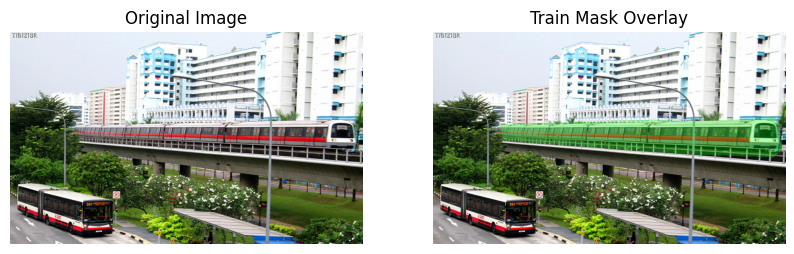

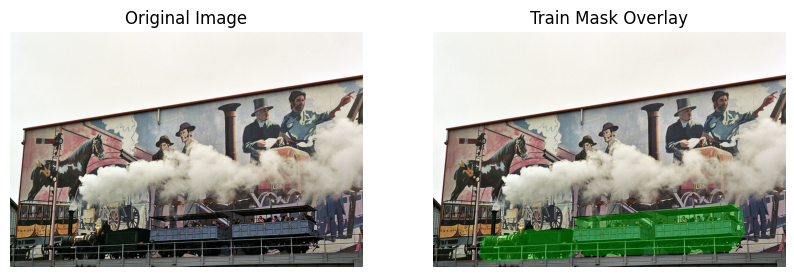

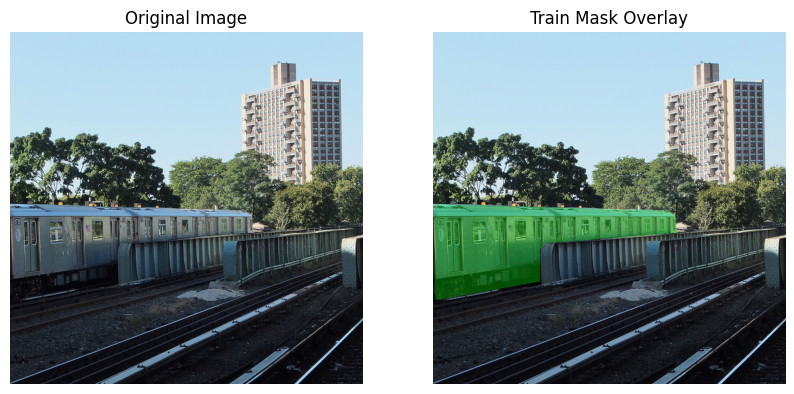

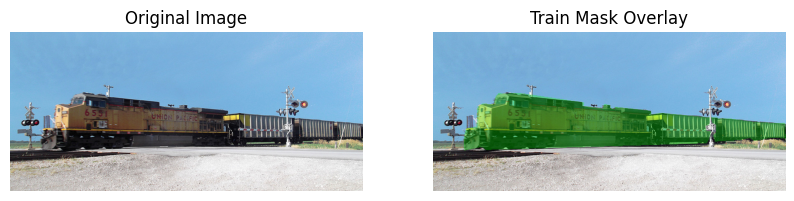

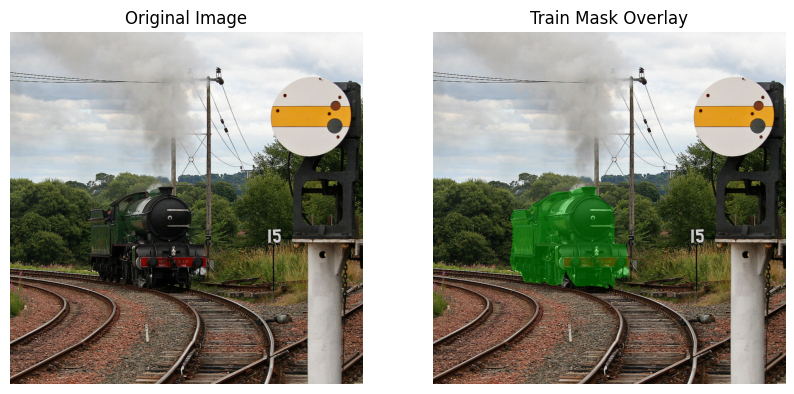

In [34]:
# =========================
# Step 1: Imports
# =========================
import os
import random
import matplotlib.pyplot as plt
import cv2
import numpy as np
from pycocotools.coco import COCO
from pycocotools import mask as mask_utils

# ======================
# Step 2: Paths
# ======================
IMG_DIR = "/content/drive/MyDrive/VisionExtract/val2017"
ANN_FILE = "/content/drive/MyDrive/VisionExtract/annotations/instances_val2017.json"

# Load COCO dataset
coco = COCO(ANN_FILE)

# ======================
# Step 3: Explore dataset
# ======================
# Images
image_files = os.listdir(IMG_DIR)
print(f"Total images in val2017: {len(image_files)}")
print("Sample images:", image_files[:10])

# Categories
categories = coco.loadCats(coco.getCatIds())
category_names = [cat['name'] for cat in categories]
print(f"Total categories: {len(category_names)}")
print("Categories:", category_names)

# ======================
# Step 4: Function to visualize image with TRAIN mask (category_id = 7)
# ======================
def visualize_image_with_train_mask(img_id):
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(IMG_DIR, img_info['file_name'])
    image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

    # Create empty mask
    mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)

    # Get only 'train' annotations (category_id = 7 in COCO)
    train_cat_id = 7
    ann_ids = coco.getAnnIds(imgIds=img_id, catIds=[train_cat_id])
    anns = coco.loadAnns(ann_ids)

    for ann in anns:
        if 'segmentation' in ann:
            rle = mask_utils.frPyObjects(ann['segmentation'], img_info['height'], img_info['width'])
            decoded_mask = mask_utils.decode(rle)
            if decoded_mask.ndim == 3:
                decoded_mask = np.sum(decoded_mask, axis=2)
            mask += decoded_mask

    mask = np.clip(mask, 0, 1)

    # Overlay mask on image (green)
    overlay = image.copy()
    overlay[mask == 1] = [0, 255, 0]  # green
    blended = cv2.addWeighted(image, 0.7, overlay, 0.3, 0)

    # Plot
    plt.figure(figsize=(10, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(blended)
    plt.title("Train Mask Overlay")
    plt.axis("off")

    plt.show()

# ======================
# Step 5: Visualize 5 random TRAIN images with masks
# ======================
train_img_ids = coco.getImgIds(catIds=[7])  # category_id=7 is train
print(f"Found {len(train_img_ids)} images containing trains.")

# Pick 5 random train images
random_img_ids = random.sample(train_img_ids, 5)

for img_id in random_img_ids:
    visualize_image_with_train_mask(img_id)
